In [1]:
# Importad las librerías necesarias aquí
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.datasets
import plotly.figure_factory as ff

from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.svm import LinearSVC
from sklearn.metrics import (accuracy_score, confusion_matrix, 
                             mean_squared_error, mean_absolute_error, mean_absolute_percentage_error,
                             silhouette_score, davies_bouldin_score,silhouette_samples)
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

## Ejercicio 1 A: descarga el dataset de Iris de sklearn y transformalo en un dataframe de pandas

In [2]:

iris = sklearn.datasets.load_iris()
df = pd.DataFrame(data = iris['data'], columns = iris['feature_names'])

df.columns = ["_".join(x.split()[:-1]) for x in df.columns]

df.head()

,sepal_length,sepal_width,petal_length,petal_width
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [3]:
target = pd.Series(data = iris['target'])
target.value_counts()

0    50
1    50
2    50
dtype: int64

## Ejercicio 1 B: Utiliza una técnica de reducción de dimensión (PCA) sobre las variables explicativas y visualiza los datos en 2 dimensiones. ¿ Qué visualización es la más adecuada para este caso concreto ?

In [4]:
# Dado que voy a tener que hacer un modelo posteriormente, es recomendable hacer primero un split de train y test

X_train, X_test, y_train, y_test = train_test_split(df,target,test_size = 0.33,random_state = 123) # Random state es para repetir siempre el mismo resultado

# Creo el objeto que calcula el PCA con el número de componentes que quiero
pca = PCA(n_components=2)

# Solo ajusto el PCA CON LOS DATOS DE ENTRENAMIENTO
X_train_pca = pd.DataFrame(pca.fit_transform(X_train),columns = ["pca1","pca2"])

# Una vez ajustado el PCA transformo los datos de test
X_test_pca = pd.DataFrame(pca.transform(X_test), columns = ["pca1","pca2"])

X_train_pca.head(10)

,pca1,pca2
0,1.549063,0.229130
1,-2.414509,0.087316
2,-2.782276,-0.119670
3,1.109900,0.410590
4,0.780884,-0.043141
5,0.056887,-0.686573
6,-0.414922,-0.363412
7,1.304423,-0.591858
8,0.816915,0.473609
9,1.790597,0.099102


In [5]:
X_test_pca.head(10)

,pca1,pca2
0,1.189216,-0.320303
1,2.053470,0.212654
2,2.047598,-0.227767
3,0.135686,-0.285540
4,-2.911369,0.249397
5,1.057685,-0.181592
6,0.706427,-0.352811
7,-3.107858,-0.363337
8,-2.996040,-0.592057
9,0.356606,-0.680772


In [6]:
# Es importante saber cuanta varianza explico con estas dos componentes
pca.explained_variance_ratio_.cumsum() # Dos variables explican el 97% de la varianza (Perdida de información insignificante)

array([0.92852086, 0.97662598])

In [7]:
# Voy a asignar colores para cada clase, que recordamos son los valores 0, 1 y 2

colores = {
    0 : "firebrick",
    1 : "steelblue",
    2 : "mediumseagreen"
}

# Asigno otro diccionario para las categorías

cat = {
    0 : "Setosa",
    1 : "Versicolor",
    2 : "Virginica"
}

# Creamos un gráfico de puntos para representar las relaciones entre esas dos variables
fig = go.Figure()

# Representamos los datos de train con círculos

fig.add_trace(
    go.Scatter(
        x = X_train_pca["pca1"],
        y = X_train_pca["pca2"],
        mode = "markers",
        marker_color = y_train.map(colores), # Asigno los colores según la clase
        marker_symbol = "circle",
        text = y_train.map(cat),
        hovertemplate = "Categoria: %{text}",
        name = "Train"
    )
)

# Representamos los datos de test con triángulos

fig.add_trace(
    go.Scatter(
        x = X_test_pca["pca1"],
        y = X_test_pca["pca2"],
        mode = "markers",
        marker_color = y_test.map(colores), # Asigno los colores según la clase
        marker_symbol = "triangle-up",
        text = y_test.map(cat),
        hovertemplate = "Categoria: %{text}",
        name = "Test"
    )
)

# Añadimos información en los ejes para completar el diseño

fig.update_layout(title = "Representación de los datos de Iris en 2 dimensiones", xaxis_title = "PCA 1", yaxis_title = "PCA 2")

# Mostramos la figura por pantalla

fig.show()

Vemos claramente que la categoría Setosa es facilmente diferenciable de las otras dos, mientras que Versicolor y Virginica están más solapadas.

## Ejercicio 1 C: Construye un modelo de clasificación lineal. Evalúa las métricas más importantes. Crea una visualización para la matriz de confusión

In [8]:
# En este caso para realizar el modelo voy a utilizar un Support Vector Machine
# Creo el objeto
svm = LinearSVC(random_state = 123) # Podemos añadir todos los parámetros que queramos para mejorar el ajuste

# Ajusto el modelo
svm.fit(X_train_pca, y_train)

# Realizo la predicción del modelo
y_train_pred = svm.predict(X_train_pca)
y_test_pred = svm.predict(X_test_pca)

# Como hemos visto arriba, las clases están balanceadas y tenemos 3 clases, luego la mejor métrica es el accuracy
# Calculamos la métrica de entrenamiento (menos importante)
train_acc = accuracy_score(y_train,y_train_pred)

# Calculamos la métrica de test (la más importante)
test_acc = accuracy_score(y_test, y_test_pred)

print(f"El Accuracy de entrenamiento es: {train_acc}")
print(f"El Accuracy de test es: {test_acc}")

El Accuracy de entrenamiento es: 0.96
El Accuracy de test es: 0.96


Dado que los errores de entrenamiento y de test son muy similares, concluimos con que el modelo está bien ajustado.

In [9]:
# Construimos una visualización para la matriz de confusión

z = confusion_matrix(y_test, y_test_pred)

# Reformateo la matriz para que me quede mejor el gráfico
z[[0,2],:] = z[[2,0],:]

x = ['Setosa', 'Versicolor', 'Virginica']
y = ['Virginica', 'Versicolor', 'Setosa']

z_text = [[str(y) for y in x] for x in z]

heatmap = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='cividis')

heatmap.show()

In [10]:
# Matriz de confusión real
confusion_matrix(y_test, y_test_pred)

array([[20,  0,  0],
       [ 0, 10,  1],
       [ 0,  1, 18]], dtype=int64)

In [11]:
confusion_matrix(y_train, y_train_pred)

array([[30,  0,  0],
       [ 0, 37,  2],
       [ 0,  2, 29]], dtype=int64)

## Ejercicio 1 D: ¿Cómo podrías visualizar las regiones de decisión del modelo anterior?

__Nota: La región de decisión de un modelo de clasificación consiste en los puntos del plano que se identifican con cada una de las categorías__ 

In [12]:
# Propuesta de solución en Stack Overflow y adaptada a plotly

# https://stackoverflow.com/questions/51297423/plot-scikit-learn-sklearn-svm-decision-boundary-surface

def make_meshgrid(x, y, h=.1):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy

# Creo un grid para que sea evaluado punto a punto y de esa forma encontrar las regiones de decisión
x_min, x_max = X_train_pca["pca1"].min() - 1, X_train_pca["pca1"].max() + 1
y_min, y_max = X_train_pca["pca2"].min() - 1, X_train_pca["pca2"].max() + 1

xx, yy = make_meshgrid(X_train_pca["pca1"], X_train_pca["pca2"],0.01)

z = svm.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

In [13]:
# Agregamos el grid que hemos creado a la gráfica fig anterior antes para mostrar 
# la separación lineal que existe entre las clases 

fig.add_trace(
    go.Contour(
        x = np.arange(x_min, x_max, 0.01),
        y = np.arange(y_min, y_max, 0.01),
        z = z,
        colorscale = [[0, 'firebrick'],[0.5,'steelblue'],[1, 'mediumseagreen']],
        showscale = False,
        contours_coloring='lines',
        name = "Región de decisión"
    )
)

fig.show()

En este gráfico vemos claramente como hay un triángulo verde que se encuentra en el lugar azul y un triángulo azul que se encuentra en la zona verde. Esto nos indica exactamente los errores de test que observamos en la matriz de confusión anterior

## Ejercicio 2 A: Descarga y lee el dataset contenido en el siguiente enlace. https://www.kaggle.com/camnugent/california-housing-prices

In [14]:
df = pd.read_csv("../../Datos/housing.csv")
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


## Ejercicio 2 B: Realiza un análisis exploratorio de los datos con los siguientes objetivos:

* Indica si hay o no valores desconocidos
* Realiza una visualización de la matriz de correlaciones
* Visualiza la relación que existe entre la proximidad al oceano con el precio mediano de la casa. ¿Indica que tipo de visualización quieres utilizar y por qué?
* ¿ Cómo afecta el número total de dormitorios al precio mediano de la casa ? Crea una gráfica que muestre la relación entre ambas variables

In [15]:
df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [16]:
# Una visualización interesante para la matriz de correlación se puede conseguir únicamente con pandas 
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(4)

C:\Users\carlo\AppData\Local\Temp/ipykernel_22100/3339292530.py:3: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.0000,-0.9247,-0.1082,0.0446,0.0696,0.0998,0.0553,-0.0152,-0.0460
latitude,-0.9247,1.0000,0.0112,-0.0361,-0.0670,-0.1088,-0.0710,-0.0798,-0.1442
housing_median_age,-0.1082,0.0112,1.0000,-0.3613,-0.3205,-0.2962,-0.3029,-0.1190,0.1056
total_rooms,0.0446,-0.0361,-0.3613,1.0000,0.9304,0.8571,0.9185,0.1980,0.1342
total_bedrooms,0.0696,-0.0670,-0.3205,0.9304,1.0000,0.8777,0.9797,-0.0077,0.0497
population,0.0998,-0.1088,-0.2962,0.8571,0.8777,1.0000,0.9072,0.0048,-0.0246
households,0.0553,-0.0710,-0.3029,0.9185,0.9797,0.9072,1.0000,0.0130,0.0658
median_income,-0.0152,-0.0798,-0.1190,0.1980,-0.0077,0.0048,0.0130,1.0000,0.6881
median_house_value,-0.0460,-0.1442,0.1056,0.1342,0.0497,-0.0246,0.0658,0.6881,1.0000


In [17]:
# Una versión con Plotly
z = round(corr,4).values
for i in range(z.shape[0]):
    if i == (z.shape[0] - i - 1):
        break
    z[[i,(z.shape[0]-i-1)],:] = z[[(z.shape[0]-i-1),i],:]

x = [x for x in df.columns if x != 'ocean_proximity']
y = [x for x in df.columns if x != 'ocean_proximity']
y.reverse()

z_text = [[str(y) for y in x] for x in z]

heatmap = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='fall')

heatmap.show()

In [18]:
df["ocean_proximity"].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [19]:
# Tenemos que mirar una "correlación" entre una variable categórica y una numérica
# Lo que haremos será observar la distribución de la numérica en función de la categórica

color_proximity = {
    '<1H OCEAN': "steelblue",
    'INLAND': "darkorange",
    'NEAR OCEAN': 'mediumseagreen',
    'NEAR BAY': 'gold',
    'ISLAND': 'indigo'
}

data = []

for proximity in df["ocean_proximity"].value_counts().index:
    
    data.append(
        go.Box(
            y = df[df["ocean_proximity"] == proximity]["median_house_value"],
            marker_color = color_proximity[proximity],
            name = proximity
        )
    )

    
layout = go.Layout(title = "Boxplots para ver la distribución del precio mediano de las casas según su cercanía al océano",
                   xaxis_title = "Proximidad", yaxis_title = "Precio mediano")

fig = go.Figure(data = data, layout = layout)

fig.show()

Aquí vemos como el precio al estar cerca de una bahía suele ser ligeramente superior a estar cerca del océano. Este precio va disminuyendo a medida que nos adentramos tierra adentro. No debemos considerar la categoría isla como algo significativo debido a su falta de muestra.

In [20]:
# Al observar la correlación entre dos variables numéricas, lo mejor es un gráfico de puntos (scatter plot)

data = [
    go.Scatter(
        x = df.dropna()["total_bedrooms"],
        y = df.dropna()["median_house_value"],
        mode = "markers",
        marker_color = "firebrick",
    )
]

layout = go.Layout(title = "Evolución del precio medio de las casas según el número total de dormitorios",
                   xaxis_title = "Número total de dormitorios", yaxis_title = 'Precio Mediano')

fig = go.Figure(data = data, layout = layout)
fig.show()

No se aprecia una correlación clara

## Ejercicio 2 C: Construye un modelo de regresión usando árboles para predecir el precio mediano de la casa. ¿Cuáles son las variables más importantes del modelo? Monta una gráfica que lo muestre.

In [21]:
# Primero pasamos la variable ocean_proximity de categórica a one-hot-encoding

df = pd.get_dummies(df, columns = ["ocean_proximity"])
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0


In [22]:
# Imputamos los NA a la media
imp_mean = SimpleImputer(missing_values = np.nan, strategy = 'mean')
imp_mean.fit(df)
df = pd.DataFrame(imp_mean.transform(df),columns = df.columns)

In [23]:
df.isna().sum()

longitude                     0
latitude                      0
housing_median_age            0
total_rooms                   0
total_bedrooms                0
population                    0
households                    0
median_income                 0
median_house_value            0
ocean_proximity_<1H OCEAN     0
ocean_proximity_INLAND        0
ocean_proximity_ISLAND        0
ocean_proximity_NEAR BAY      0
ocean_proximity_NEAR OCEAN    0
dtype: int64

In [24]:
# Hacemos train-test-split
X_train, X_test, y_train, y_test = train_test_split(df[[x for x in df.columns if x != "median_house_value"]],
                                                    df["median_house_value"],
                                                    test_size = 0.33,
                                                    random_state = 123)

In [25]:
# Creo el modelo con RandomForest
rf = RandomForestRegressor(random_state = 123)

# Ajusto el modelo con los datos de train
rf.fit(X_train,y_train)

RandomForestRegressor(random_state=123)

In [26]:
# Creamos una estructura de dataframe para que se vea más claro
importancia = pd.DataFrame()

importancia["feature_importance"] = rf.feature_importances_
importancia["columna"] = df[[x for x in df.columns if x != "median_house_value"]].columns.tolist()
importancia

,feature_importance,columna
0,0.107875,longitude
1,0.103278,latitude
2,0.047212,housing_median_age
3,0.025303,total_rooms
4,0.022677,total_bedrooms
5,0.032141,population
6,0.020197,households
7,0.489032,median_income
8,0.002956,ocean_proximity_<1H OCEAN
9,0.140985,ocean_proximity_INLAND


In [27]:
# Visualizamos el anterior ordenando por importancia, para ello realizamos un gráfico de barras horizontal 
# que permita comparar facilmente cada una de las variables ordenadas de mayor a menor
importancia.sort_values("feature_importance", inplace = True)

data = [
    go.Bar(
        x = importancia["feature_importance"],
        y = importancia["columna"],
        marker_color = "steelblue",
        name = "Importancia de variables",
        orientation = 'h'
    )
]

layout = go.Layout(title = "Importancia de variables para el Random Forest", xaxis_title = "Importancia",
                   yaxis_title = "Variable")

fig = go.Figure(data = data, layout = layout)

fig.show()

El precio de una casa está determinado mayormente por los ingresos de las personas que la contienen

## Ejercicio 2 D: Evalúa el modelo anterior y saca las métricas más relevantes que consideres. ¿Qué interpretación puedes sacar del modelo anterior con todo lo recopilado?

In [28]:
predictions_train = rf.predict(X_train)
predictions = rf.predict(X_test)

# Solución de Nico Oriol
rmse_train = np.sqrt(mean_squared_error(y_train,predictions_train))
mae_train = mean_absolute_error(y_train, predictions_train)
mape_train = mean_absolute_percentage_error(y_train, predictions_train)

rmse_test = np.sqrt(mean_squared_error(y_test,predictions))
mae_test = mean_absolute_error(y_test, predictions)
mape_test = mean_absolute_percentage_error(y_test, predictions)

print("El RMSE de train del modelo es: {}".format(rmse_train))
print(f"El MAE de train del modelo es: {mae_train}")
print(f"El MAPE de train del modelo es: {100 * mape_train} %")

print("")

print("El RMSE de test del modelo es: {}".format(rmse_test))
print(f"El MAE de test del modelo es: {mae_test}")
print(f"El MAPE de test del modelo es: {100*mape_test} %")

El RMSE de train del modelo es: 18728.978154825378
El MAE de train del modelo es: 12108.243920306624
El MAPE de train del modelo es: 6.708668217922392 %

El RMSE de test del modelo es: 48334.378396912354
El MAE de test del modelo es: 31807.714053141517
El MAPE de test del modelo es: 17.958422313216076 %


Los errores MAPE están revelando que hay sobreajuste entre los datos de train y los datos de test, esto se puede arreglar bajando el número de árboles y reduciendo su profundidad entre otras cosas.

## Ejercicio 3 A: Descarga y lee el csv de https://www.kaggle.com/harrywang/wine-dataset-for-clustering 

In [29]:
df = pd.read_csv("../../Datos/wine-clustering.csv")
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [30]:
# Dado que vamos a usar un clustering, es mejor escalar las variables para que 
# las distancias se normalicen tanto como sea posible en este caso vamos a usar un MinMaxScaler
# Que consiste en pasar todas las variables al intervalo 0,1

scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df),columns = df.columns)
df_scaled.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,0.842105,0.191700,0.572193,0.257732,0.619565,0.627586,0.573840,0.283019,0.593060,0.372014,0.455285,0.970696,0.561341
1,0.571053,0.205534,0.417112,0.030928,0.326087,0.575862,0.510549,0.245283,0.274448,0.264505,0.463415,0.780220,0.550642
2,0.560526,0.320158,0.700535,0.412371,0.336957,0.627586,0.611814,0.320755,0.757098,0.375427,0.447154,0.695971,0.646933
3,0.878947,0.239130,0.609626,0.319588,0.467391,0.989655,0.664557,0.207547,0.558360,0.556314,0.308943,0.798535,0.857347
4,0.581579,0.365613,0.807487,0.536082,0.521739,0.627586,0.495781,0.490566,0.444795,0.259386,0.455285,0.608059,0.325963


## Ejercicio 3 B: Genera un modelo de clustering para agrupar los diferentes tipos de vinos

In [31]:
# Usamos un K-Means para montar el cluster, para ello necesitamos decidir cuanto es el número óptimo de clusters

inertias = []

# Creating 10 K-Mean models while varying the number of clusters (k)
for k in range(1,16):
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(df_scaled)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

data = [
  go.Scatter(
    x = list(range(1,16)),
    y = inertias,
    name = "Clusters",
    mode = "lines+markers",
    line = dict(color = "mediumseagreen"),
  )
]

layout = go.Layout(title = "Selecting the number of clusters", xaxis_title = "Number of clusters", yaxis_title = "Inertia", height = 500)

fig = go.Figure(data = data, layout = layout)

fig.show()

C:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



El número óptimo de clusters puede estar entre 3 y 4, para decidirnos vamos a usar algunas métricas que puedan indicarnos cuál sea el mejor número de clusters

## Ejercicio 3 C: Evalúa el modelo de clustering usando dos métricas distintas

In [32]:
# Usamos el coeficiente de la silueta
posibles_clusters = [3,4]

for n_clusters in posibles_clusters:
    clusterer = KMeans(n_clusters = n_clusters, random_state = 123)
    cluster_labels = clusterer.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled,cluster_labels)
    print("Para {} clusters, el coeficiente de silueta medio es : {}".format(n_clusters,silhouette_avg))

Para 3 clusters, el coeficiente de silueta medio es : 0.29936674064895064
Para 4 clusters, el coeficiente de silueta medio es : 0.25993667561623146


In [33]:
# Usamos la métrica de davies-boulding, un criterio basado en el ratio entre las distancias intra clusters y las distancias
# entre clusters, cuanto menor sea esta métrica, mejor es el valor

for n_clusters in posibles_clusters:
    clusterer = KMeans(n_clusters = n_clusters, random_state = 123)
    cluster_labels = clusterer.fit_predict(df_scaled)
    dbscore = davies_bouldin_score(df_scaled,cluster_labels)
    print("Para {} clusters, el score de Davies-Bouldin es : {}".format(n_clusters,dbscore))

Para 3 clusters, el score de Davies-Bouldin es : 1.3095913112417223
Para 4 clusters, el score de Davies-Bouldin es : 1.7230661310580349


Concluimos entonces con que el 3 clusters es el número óptimo de clusters

In [34]:
kmeans = KMeans(n_clusters = 3, random_state = 123)
cluster_labels = kmeans.fit_predict(df_scaled)

## Ejercicio 3 D: Visualiza, con técnicas de reducción de dimensión, cómo quedan distribuidos los clusters.

In [35]:
# Usamos TSNE como otra alternativa para reducir y visualizar los puntos
tsne = TSNE(random_state = 123)

# Ajusto el tsne
df_tsne = pd.DataFrame(tsne.fit_transform(df), columns = ["TSNE-1","TSNE-2"])

df_tsne.head()

,TSNE-1,TSNE-2
0,6.305212,7.398840
1,6.574814,6.659297
2,8.194910,8.696045
3,10.134165,10.880272
4,0.819517,0.337009


In [36]:
# Una función para visualizar el coeficiente de la silueta con plotly

def visualize_silhouette_scores(X,cluster_labels,plot_df):
  
    colors = {
    0 : "firebrick",
    1 : "gold",
    2 : "indigo",
    3 : "black",
    4 : "forestgreen",
    5 : "darkorange",
    6 : "lightblue",
    7 : "lightgrey"
    }

    # Create a subplot with 1 row and 2 columns
    fig = make_subplots(rows=1, cols=2,
                        print_grid=False,
                        subplot_titles=('The silhouette plot for the various clusters.',
                                        'The visualization of the clustered data.'))

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    fig['layout']['xaxis1'].update(title='The silhouette coefficient values',
                                   range=[-0.3, 1])

    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    fig['layout']['yaxis1'].update(title='Cluster label',
                                   showticklabels=False,
                                   range=[0, len(X) + (len(np.unique(cluster_labels)) + 1) * 10])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", len(np.unique(cluster_labels)),
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10

    for i in range(len(np.unique(cluster_labels))):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        filled_area = go.Scatter(
            y=np.arange(y_lower, y_upper),
            x=ith_cluster_silhouette_values,
            mode='lines',
            showlegend=False,
            line=dict(width=0.5, color=colors[i]), fill='tozerox')
        fig.append_trace(filled_area, 1, 1)
        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples


    # The vertical line for average silhouette score of all the values
    axis_line = go.Scatter(x=[silhouette_avg,silhouette_avg],
                           y=[0, y_upper+10],
                           showlegend=False,
                           mode='lines',
                           line=dict(color="red", dash='dash',
                                     width =1.5))

    fig.append_trace(axis_line, 1, 1)

    # 2nd Plot showing the actual clusters formed
    color_label = [colors[x] for x in cluster_labels]
    clusters = go.Scatter(x=plot_df.values[:, 0], 
                          y=plot_df.values[:, 1], 
                          showlegend=False,
                          mode='markers+text',
                          marker=dict(color=color_label)
                         )
    fig.append_trace(clusters, 1, 2)

    fig['layout']['xaxis2'].update(title='Feature space for the 1st feature',
                                   zeroline=False)
    fig['layout']['yaxis2'].update(title='Feature space for the 2nd feature',
                                  zeroline=False)

    fig['layout'].update(title="Silhouette analysis for clustering "
                         "with n_clusters = {}".format(len(np.unique(cluster_labels))),
                         height = 500)

    fig.show()

In [37]:
# Uso esta función para que tengáis una forma de 
visualize_silhouette_scores(df_scaled,cluster_labels,df_tsne)

For n_clusters = 3 The average silhouette_score is : 0.29936674064895064


## Ejercicio 3 E: Extrae, a partir de visualizaciones, 3 características que diferencien un cluster de otro.

In [38]:
# Añadimos los clusters al dataset original
df["labels"] = cluster_labels

<Figure size 2160x1080 with 0 Axes>

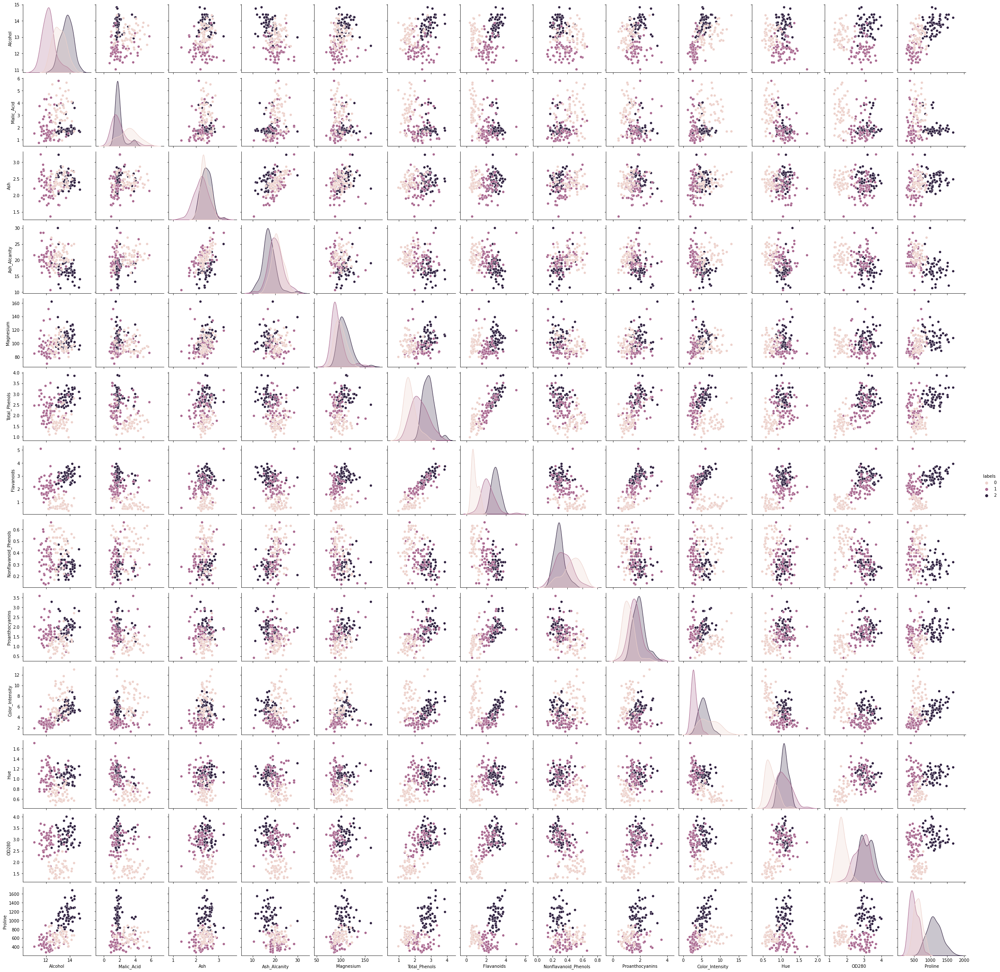

In [39]:
# Una forma rápida de identificar de un vistazo relaciones entre variables es usando pairplot de seaborn
plt.figure(figsize = (30,15))
sns.pairplot(data = df, hue = 'labels')
plt.show()

* La clase 1 suele contener menos alcohol que la 0, y la 0 menos que la 2.
* La clase 2 tiene en general, más cantidad de Proline
* La clase 0 tiene menos flavonoides que el resto

In [40]:
# Otra forma con subplots para visualizar algo así
features = [x for x in df.columns if x != "labels"]

fig = make_subplots(rows = 4, cols = 4)

#Preparo la estructura de filas y columnas para asignar
rows = np.repeat([1,2,3,4], 4)[:-3]
cols = [1,2,3,4]*4
cols = cols[:-3]

# Creo secuencialmente la figura con un loop
for feature, row, col in zip(features,rows,cols):
    if feature == features[-1]:
        showlegend = True
    else:
        showlegend = False
        
    fig.add_trace(
        go.Histogram(
            x = df[df["labels"] == 0][feature],
            marker_color = "steelblue",
            xbins=dict(
                start=df[feature].min()-1,
                end=df[feature].max()+1,
                size=(df[feature].max() - df[feature].min())/30
            ),
        name = "Clase 0",
        opacity = 0.7,
        showlegend = showlegend
        ),
        row = row,
        col = col
    )
    
    fig.add_trace(
        go.Histogram(
            x = df[df["labels"] == 1][feature],
            marker_color = "darkorange",
            xbins=dict(
                start=df[feature].min()-1,
                end=df[feature].max()+1,
                size=(df[feature].max() - df[feature].min())/30
            ),
        name = "Clase 1",
        opacity = 0.7,
        showlegend = showlegend
        ),
        row = row,
        col = col
    )
    
    fig.add_trace(
        go.Histogram(
            x = df[df["labels"] == 2][feature],
            marker_color = "mediumseagreen",
            xbins=dict(
                start=df[feature].min()-1,
                end=df[feature].max()+1,
                size=(df[feature].max() - df[feature].min())/30
            ),
        name = "Clase 2",
        opacity = 0.7,
        showlegend = showlegend
        ),
        row = row,
        col = col
    )
    fig.update_xaxes(title_text = feature, row = row, col = col)
    
fig.update_layout(title = "Histogramas por clusters",bargap=0.1,barmode = "overlay",
                  height = 1300, width = 1000)

fig.show()

## Ejercicio 4 A: Descarga y lee el csv de Titanic de https://www.kaggle.com/cities/titanic123 (Puedes usar la librería Seaborn para leer este dataset sin necesidad de descargarlo)

In [41]:
df = sns.load_dataset('titanic')
df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [42]:
df.isna().sum()

survived         0
pclass           0
sex              0
age            177
sibsp            0
parch            0
fare             0
embarked         2
class            0
who              0
adult_male       0
deck           688
embark_town      2
alive            0
alone            0
dtype: int64

## Ejercicio 4 B: Realiza una gráfica para sacar la siguiente información:

* ¿Cuál es la distribución de las edades de las mujeres que fallecieron en el barco?
* ¿En qué proporción sobrevivieron los hombres, mujeres del barco?
* ¿El barco priorizó salvar alguna clase (primera, segunda o tercera) en particular?
* ¿Existe alguna franja de edad que se priorizara para salvarse?

__Justifica por qué usas estas visualizaciones y realízalo todo en una única gráfica__

In [43]:
fig = make_subplots(
    rows = 2,
    cols = 2,
    subplot_titles=("Edades de las mujeres que fallecieron en el barco",
                    "Proporción de supervivencia por sexo",
                    "Supervivientes según su clase",
                    "Supervivientes por franja de edad")
)

# Primera figura 
fig.add_trace(
    go.Box(
        y = df[(df["sex"] == "female") & (df["survived"] == 0)]["age"],
        marker_color = "darkorange",
        name = "Mujeres fallecidas por franja de edad",
        showlegend = False,
        boxpoints = "all"
    ),
    row = 1,
    col = 1
)

# Segunda figura

values = (df[df["survived"] == 1]["who"].value_counts()/df["who"].value_counts()).values

fig.add_trace(
    go.Bar(
        x = ["Niños","Hombres","Mujeres"],
        y = values,
        marker_color = ["steelblue","mediumseagreen","darkorange"],
        name = "Supervivientes",
        showlegend = False
    ),
    row = 1,
    col = 2
)

# Tercera figura

fig.add_trace(
    go.Bar(
        x=["Clase 1", "Clase 2", "Clase 3"],
        y=df[df["survived"] == 1]["class"].value_counts().sort_index().values,
        name='Supervivientes',
        marker_color='green',
        showlegend = False
    ),
    row = 2,
    col = 1
)
fig.add_trace(
    go.Bar(
        x=["Clase 1", "Clase 2", "Clase 3"],
        y=df[df["survived"] == 0]["class"].value_counts().sort_index().values,
        name='Fallecidos',
        marker_color='red',
        showlegend = False
    ),
    row = 2,
    col = 1
)

# Cuarta Figura

fig.add_trace(
    go.Histogram(
        x = df[df["survived"] == 0]["age"],
        marker_color = "red",
        name = "Fallecidos",
        showlegend = False,
        opacity = 0.7,
        histnorm = "probability"
    ),
    row = 2,
    col = 2
)

fig.add_trace(
    go.Histogram(
        x = df[df["survived"] == 1]["age"],
        marker_color = "green",
        name = "Supervivientes",
        showlegend = False,
        opacity = 0.7,
        histnorm = "probability"
    ),
    row = 2,
    col = 2
)

# Actualizar el diseño
fig.update_layout(
    width = 1000,
    height = 1000,
)

fig.update_xaxes(title_text="Edades", row=2, col=2)

fig.show()

In [44]:
# Otra forma de hacer el tercer gráfico
# Para calcular los valores he utilizado la siguiente linea de código
# df.groupby("class")["survived"].value_counts()

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = ["Total Clase 1", "Total Clase 2", "Total Clase 3", "Supervivientes Clase 1", "Fallecidos Clase 1",
               "Supervivientes Clase 2", "Fallecidos Clase 2","Supervivientes Clase 3","Fallecidos Clase 3"],
      color = ["indigo", "lightblue", "gold", "green","red","green","red","green","red"]
    ),
    link = dict(
      source = [0, 0, 1, 1, 2, 2],
      target = [3, 4, 5, 6, 7, 8],
      value = [136, 80, 87, 97, 119, 372]
  ))])


fig.show()

Conclusiones:

* 1er gráfico: Selecciono un boxplot únicamente porque he hecho muchos histogramas para ver distribuciones y no había realizado ningún boxplot para ver una distribución. En este caso era mejor un histograma de nuevo. Observamos que la edad de las mujeres fallecidas se encuentra principalmente entre los 15 y los 45 años.
* 2do gráfico: En este caso he optado por un gráfico de barras para ver la proporción de supervivencia calculada previamente, un pie chart también podría funcionar. Claramente observamos la tendencia de salvar a mujeres y niños por encima de los hombres.
* 3er gráfico: La idea era usar un Sankey plot pero no es compatible con los subplots por limitación de Plotly por lo tanto utilizo de nuevo las barras para visualizar. La tendencia de salvar a las personas de primera y segunda clase es clara.
* 4to gráfico: De nuevo, las limitaciones de usar subplots impiden que el histograma pueda estar en overlay sin cargarme el gráfico 3. Aparentemente no hay una franja de edad que tenga una especial supervivencia (quizás los niños de menos de 5 años). Importante usar aquí que los histogramas estén normalizados para evitar comparaciones de franjas de edad con distintos tamaños de muestra.